<a href="https://colab.research.google.com/github/AslauAlexandru/Techwithwarriors-Generative-AI-Internship-Tasks/blob/main/TECHWITHWARRIORS_Generative_AI_Internship_Task_04.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Task 04

Implement a text-to-image generation model
using Stable Diffusion or DALL-E.

Task Details: Create images from textual
descriptions using models like Stable Diffusion or
DALL-E.

In [1]:
!pip install diffusers
!pip install transformers
!pip install Pillow
!pip install accelerate scipy safetensors
!pip install min-dalle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 29.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 431.4/431.4 kB 27.4 MB/s eta 0:00:00
  Created wheel for min-dalle: filename=min_dalle-0.4.11-py3-none-any.whl size=10518 sha256=957a9e7f17b9df6a82347c63d0d96bb99f1d26e0e8d6f48379222d1b1606b954
  Stored in directory: /root/.cache/pip/wheels/52/6d/e3/c4eae4ec07f23168d03ed0f58073be84cd4d0a4c990eec7dc2
Successfully built min-dalle


#Stable Diffusion

In [2]:
from accelerate import Accelerator

accelerator = Accelerator()

device = accelerator.device

In [3]:
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image

In [4]:
# Replace the model version with your required version if needed
pipeline = StableDiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1", torch_dtype=torch.float16
)

# Running the inference on GPU with cuda enabled
#pipeline = pipeline.to('cuda')
pipeline = pipeline.to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [5]:
prompt = "A photo with George Washington on moon riding on horse"

image = pipeline(prompt=prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

In [6]:
image.show()

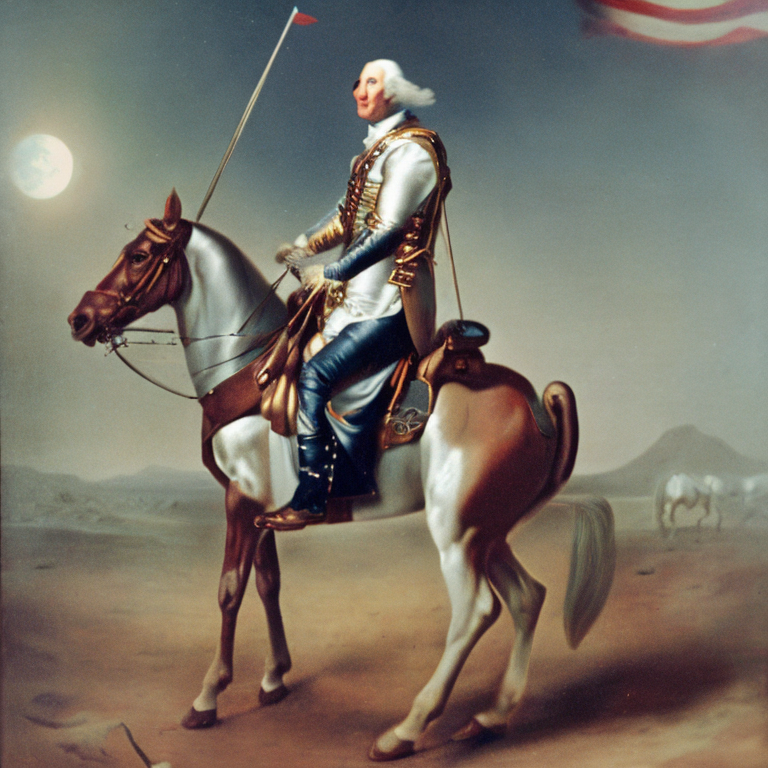

In [7]:
from IPython.display import display
display(image)

In [14]:
prompt = "A photo with Abraham Lincoln on mars riding a white tiger"

image = pipeline(prompt=prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

In [15]:
image.show()

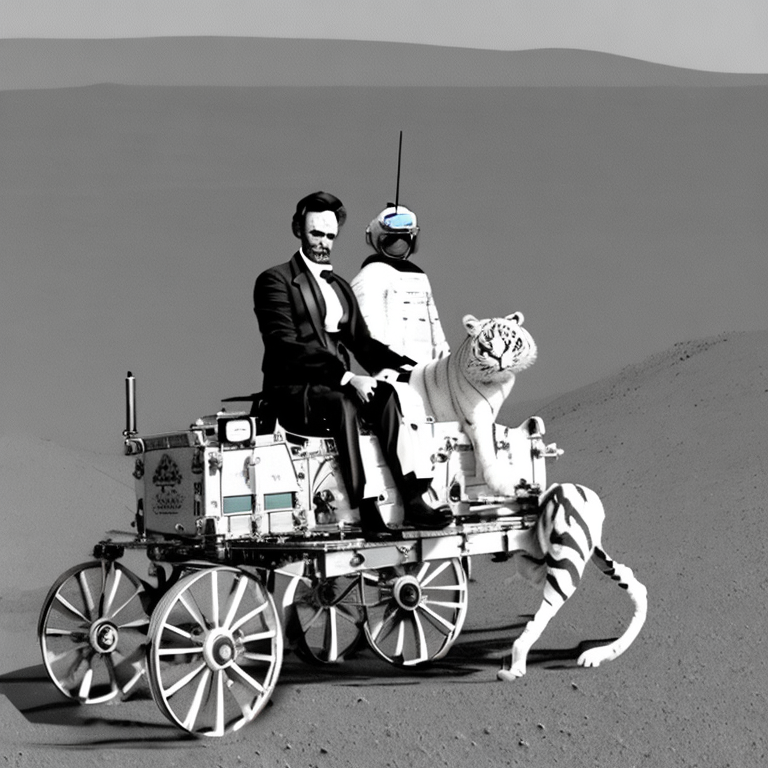

In [16]:
from IPython.display import display
display(image)

#Dalle

In [11]:
from min_dalle import MinDalle

model = MinDalle(
    models_root='./pretrained',
    dtype=torch.float16,
    device=device,#device='cuda'
    is_mega=True,
    is_reusable=True
)

using device cuda
downloading tokenizer params
intializing TextTokenizer
downloading encoder params
initializing DalleBartEncoder


/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:122: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  params = torch.load(self.encoder_params_path)


downloading decoder params
initializing DalleBartDecoder


/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:140: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  params = torch.load(self.decoder_params_path)


downloading detokenizer params
initializing VQGanDetokenizer


/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:151: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  params = torch.load(self.detoker_params_path)


/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:201: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:208: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


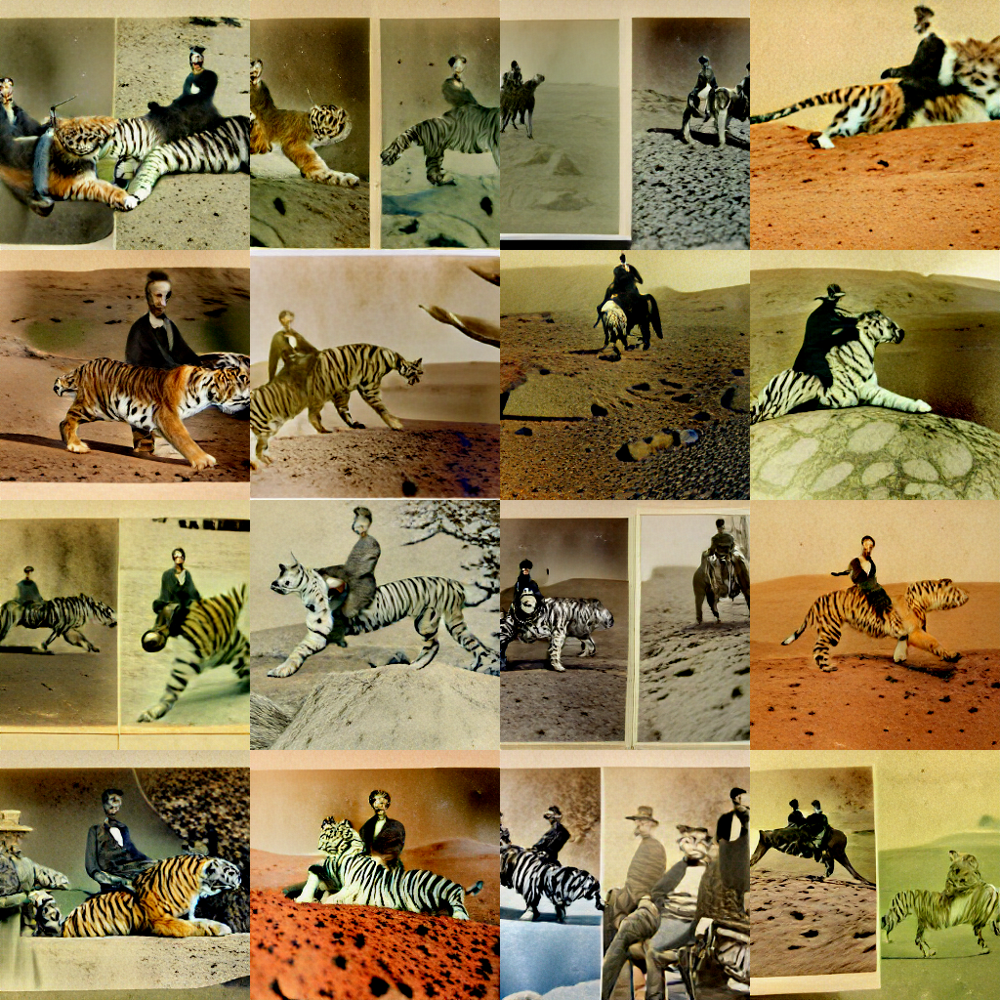

In [12]:
image = model.generate_image(
    text='A photo with Abraham Lincoln on mars riding on tiger',
    seed=-1,
    grid_size=4,
    is_seamless=False,
    temperature=1,
    top_k=256,
    supercondition_factor=32,
    is_verbose=False
)


image.show()
from IPython.display import display
display(image)

/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:201: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:208: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


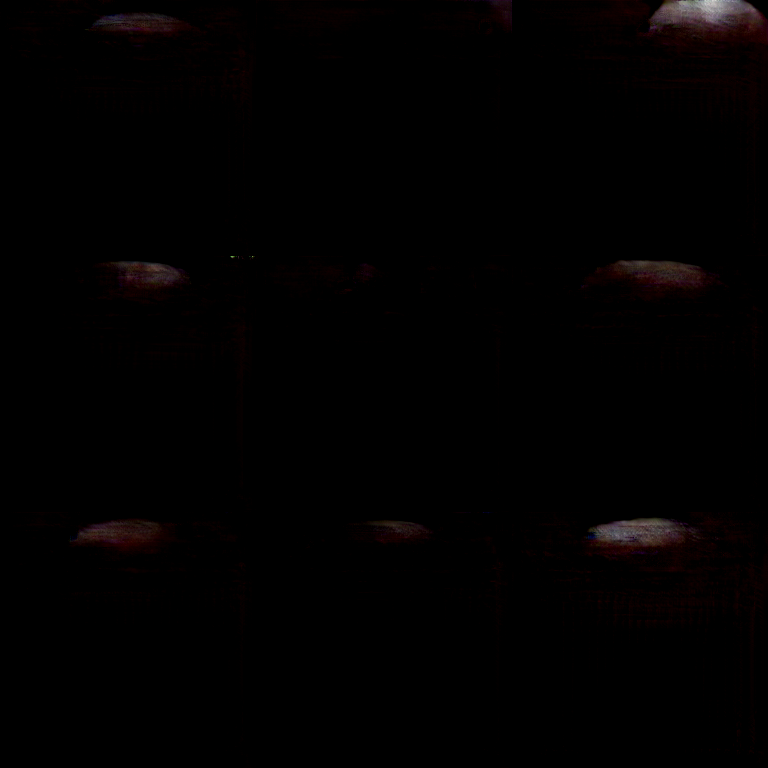

/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


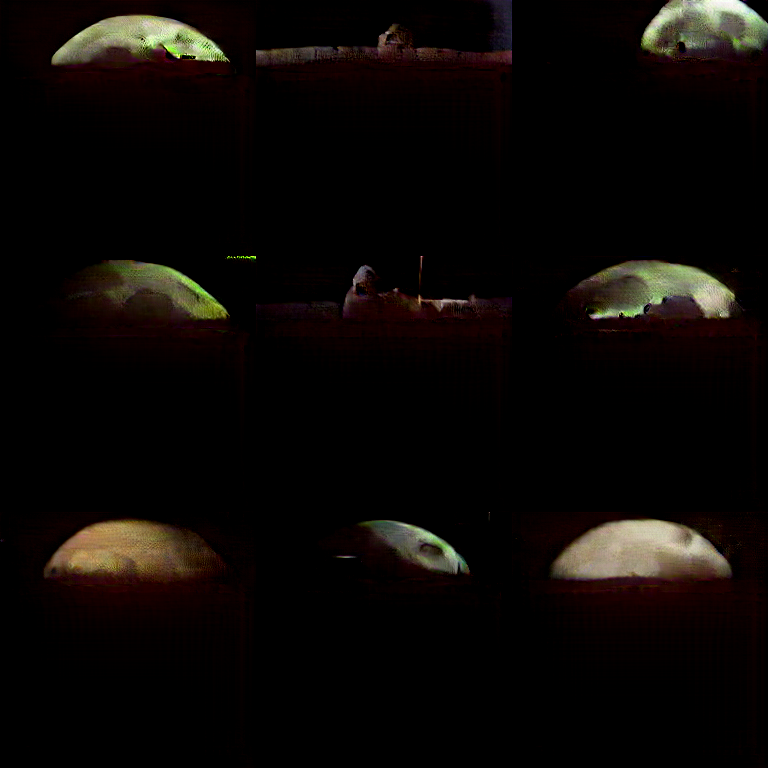

/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


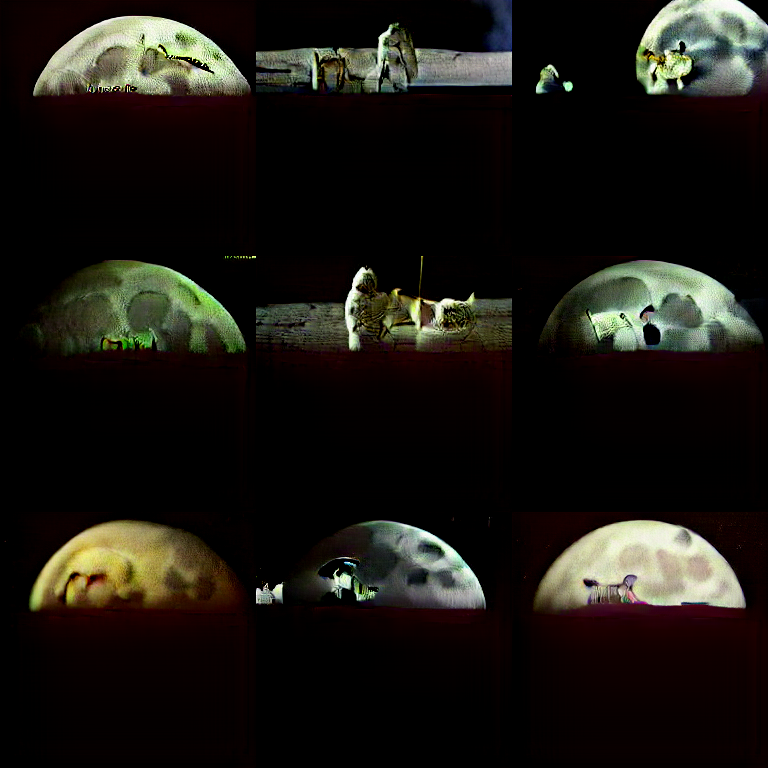

/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


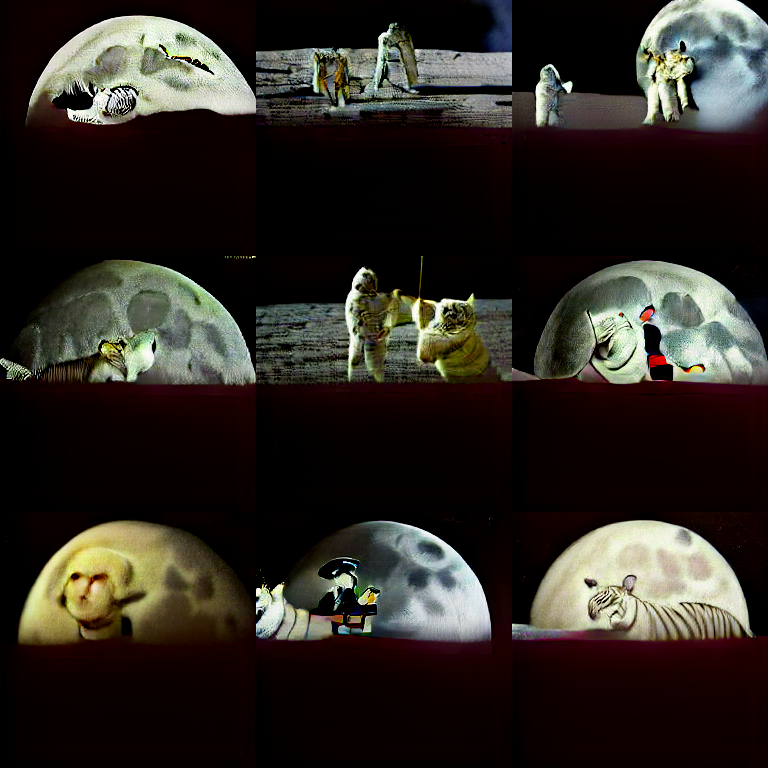

/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


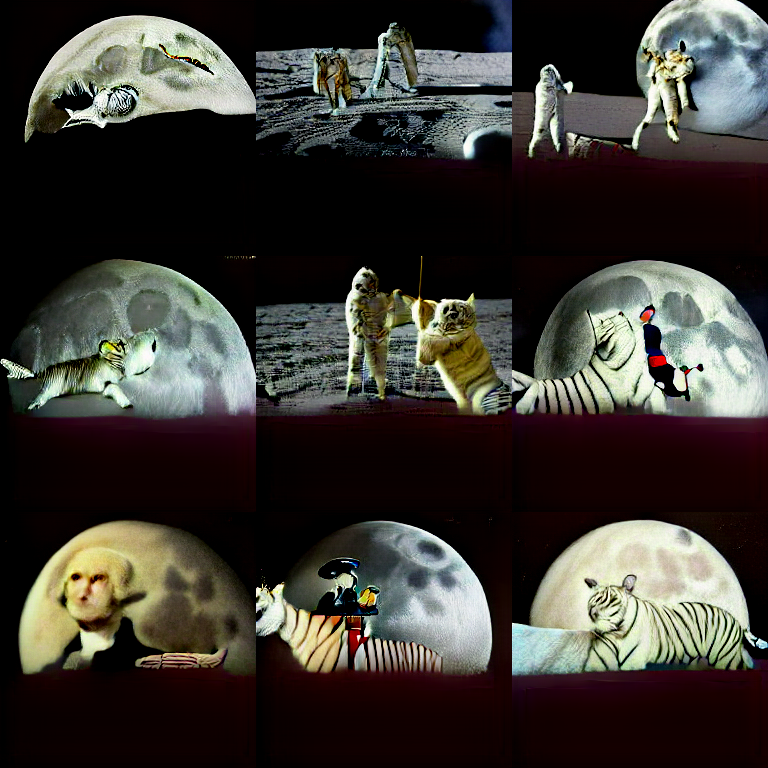

/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


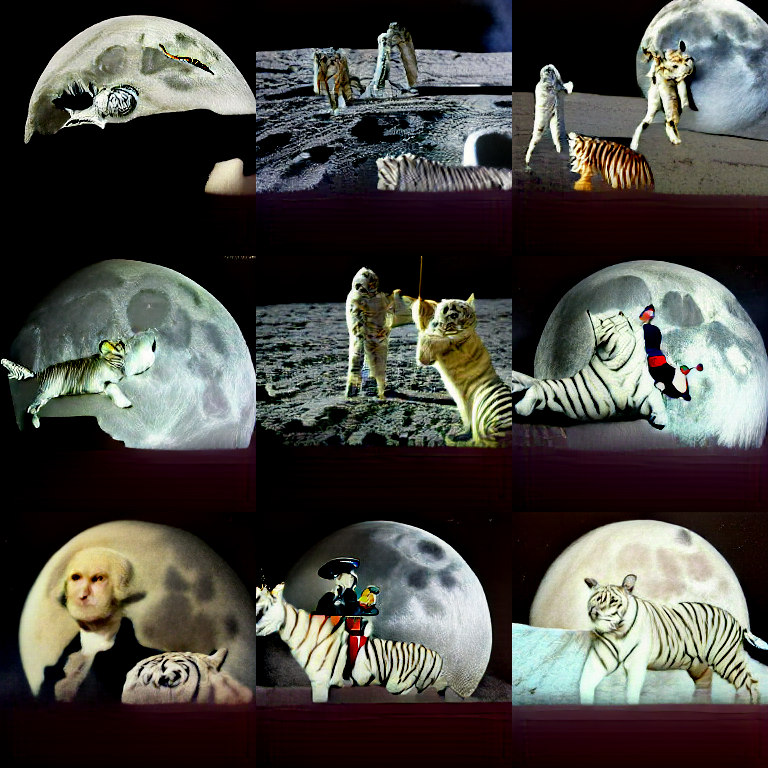

/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


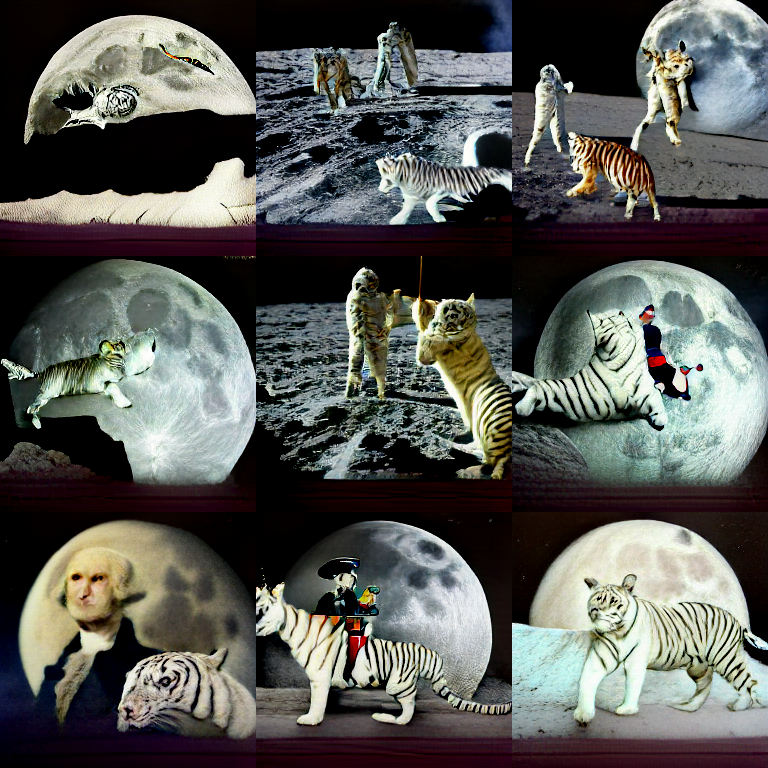

/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:239: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=self.dtype):
/usr/local/lib/python3.10/dist-packages/min_dalle/min_dalle.py:251: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float32):


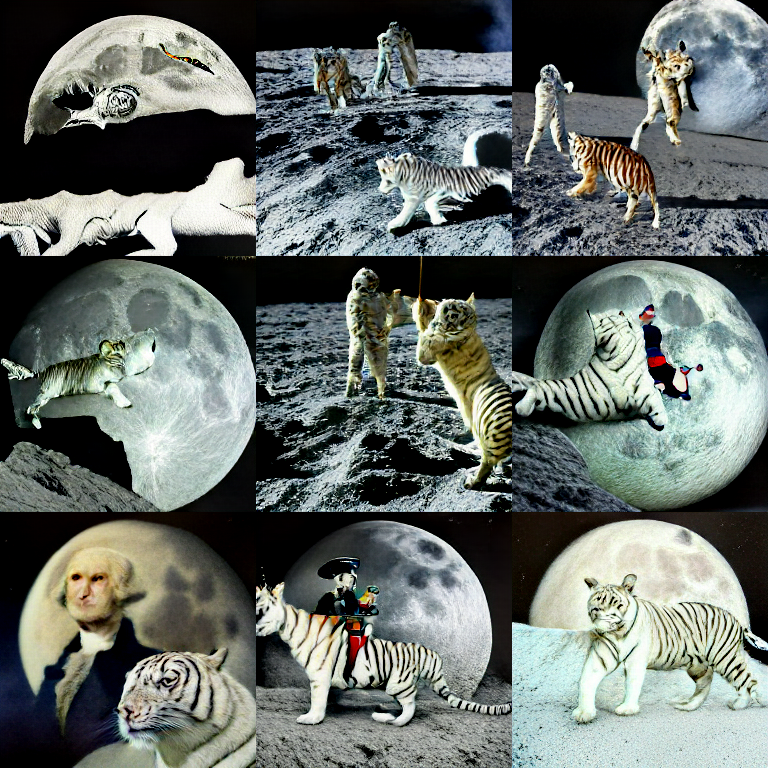

In [13]:
image_stream = model.generate_image_stream(
    text='A photo with George Washington on moon riding on white tiger',
    seed=-1,
    grid_size=3,
    progressive_outputs=True,
    is_seamless=False,
    temperature=1,
    top_k=256,
    supercondition_factor=16,
    is_verbose=False
)

for image in image_stream:
    image.show()
    from IPython.display import display
    display(image)